In [1]:
%config InlineBackend.figure_format='retina'
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.cm as cm
import seaborn as sns; sns.set()
import arviz as az

import numpy as np
from tabulate import tabulate
import pandas as pd
import pickle
import os
import torch
import numpy as np
from scipy import stats
from sklearn import preprocessing

import torch.distributions as td

import numpyro
from numpyro.infer import MCMC, NUTS, Predictive
import numpyro.distributions as dist
from jax import random
from jax.nn import logsumexp
import jax.numpy as jnp

import sys
sys.path.append("/home/cbarkhof/fall-2021")

BDA_MODEL_DIR = "BDA-models"
os.makedirs(BDA_MODEL_DIR, exist_ok=True)

In [2]:
from analysis.analysis_utils import get_n_data_samples_x_y

valid_x, valid_y = get_n_data_samples_x_y(image_dataset_name="bmnist", N_samples=1000, phase="valid")
type(valid_x), valid_x.shape, type(valid_y), valid_y.shape

(torch.Tensor, torch.Size([1000, 1, 28, 28]), torch.Tensor, torch.Size([1000]))

In [3]:
class GenerativeModelDataView:
    def __init__(self, obs_x, obs_y, num_samples=1000, num_chains=1, num_warmup=100):
        
        assert obs_x.ndim == 2, f"obs_x is assumed to be [B, D], currrent shape: {obs_x.shape}"
        assert obs_y.ndim == 1, f"obs_y is assumed to be 1D, current shape: {obs_y.shape}"
        assert len(obs_x) == len(obs_y), f"obs_x is assumed to be of the same length as obs_y"
        
        self.obs_x = obs_x
        self.obs_y = obs_y
        
        self.T = 10
        self.D = obs_x.shape[1]
        self.N = self.obs_x.shape[0]
        
        self.active = np.zeros((self.T, self.D))
        self.inactive = np.zeros((self.T, self.D))
        for i in range(self.T):
            self.active[i, :] = self.obs_x[obs_y == i].sum(axis=0)
            self.inactive[i, :] = (1.0 - self.obs_x[obs_y == i]).sum(axis=0)
            
#             self.active = self.active.at[i, :].set(self.obs_x[obs_y == i].sum(axis=0))
#             self.inactive = self.inactive.at[i, :].set((1.0 - self.obs_x[obs_y == i]).sum(axis=0))
        
        self.num_samples = num_samples
        self.num_chains = num_chains
        self.num_warmup = num_warmup

        self.rng_key = random.PRNGKey(0)

        nuts_kernel = NUTS(self.conditional_model)
        self.mcmc = MCMC(nuts_kernel, num_samples=num_samples, num_warmup=num_warmup, num_chains=num_chains)

        self.prior_predictive = None
        self.posterior_predictive = None
        self.posterior_samples = None
    
    def conditional_model(self, obs_x=None):
        # alpha = numpyro.sample("alpha", dist.Exponential(1.))
        alpha = numpyro.deterministic("alpha", 0.2)
        beta = numpyro.deterministic("beta", 1.0)
        
        concentration_a = numpyro.deterministic("concentration_a", alpha + self.active)
        concentration_b = numpyro.deterministic("concentration_b", beta + self.inactive)
        
        with numpyro.plate("observations", self.N):
            
            concentration_a_y = concentration_a[self.obs_y, :]
            concentration_b_y = concentration_b[self.obs_y, :]
            
            sampled_x = numpyro.sample("sampled_x", 
                                       dist.conjugate.BetaBinomial(concentration1=concentration_a_y, 
                                                                   concentration0=concentration_b_y,
                                                                   total_count=1).to_event(1), 
                                       obs=obs_x)

        return sampled_x
    
    def posterior(self):
        alpha = numpyro.deterministic("alpha", 0.2)
        beta = numpyro.deterministic("beta", 1.0)
        
        concentration_a = numpyro.deterministic("concentration_a", alpha + self.active)
        concentration_b = numpyro.deterministic("concentration_b", beta + self.inactive)

        return dist.Beta(concentration_a, concentration_b)

    def conditional_posterior_predictive(self, obs_ys):
        alpha = numpyro.deterministic("alpha", 0.2)
        beta = numpyro.deterministic("beta", 1.0)
        
        concentration_a = numpyro.deterministic("concentration_a", alpha + self.active)
        concentration_b = numpyro.deterministic("concentration_b", beta + self.inactive)
        
        concentration_a_y = concentration_a[obs_ys, :]
        concentration_b_y = concentration_b[obs_ys, :]
        
        return dist.BetaBinomial(concentration1=concentration_a_y, 
                                 concentration0=concentration_b_y, total_count=1).to_event(1)

    def assess_unconditional_posterior_predictive(self, obs_xs):
        """ Assess p(x*|x) for given x* (obs_xs)
            p(x*=x*|x) = \sum_y p(x*, y*|x) = \sum_y p(x*|x, y*)p(y*) = \sum_y p(x*|x, y*)(1/T) """
        
        # [T * Nx] [0, 1, 2, .., 9, 0, 1, 2, ..., 9, ..., 9]
        y_all_classes = np.concatenate([np.arange(self.T) for _ in range(len(obs_xs))])
        
        # [T * Nx, D] [x1, x1, ..., x2, x2, ..., x9, x9, ...]
        obs_xs_all_class = np.repeat(obs_xs, self.T, axis=0)
        
        # [T * Nx]
        post_all_classes = self.conditional_posterior_predictive(y_all_classes)
        
        # [T*N] -> [N, T]
        log_prob_all_class = post_all_classes.log_prob(obs_xs_all_class).reshape(len(obs_xs), self.T)
        log_prob_all_class -= jnp.log(self.T)
        
        # [N]
        log_pxs_px = logsumexp(log_prob_all_class, axis=1)
        
#         pxs_px = jnp.exp(log_pxs_px)
        
        return log_pxs_px
    
    def classification_distribution(self, obs_xs):
        """ Determine p(y*|x, x*) for given x* (obs_xs)
            p(y*|x, x*) = p(x*, y*|x) / p(x*|x) = p(x*|x, y*)p(y*) / p(x*|x)
        """
        
        # [T * Nx] [0, 1, 2, .., 9, 0, 1, 2, ..., 9, ..., 9]
        y_all_classes = np.concatenate([np.arange(self.T) for _ in range(len(obs_xs))])
        
        
        # [T * Nx, D] [x1, x1, ..., x2, x2, ..., x9, x9, ...]
        obs_xs_all_class = np.repeat(obs_xs, self.T, axis=0)
        
        # [T * Nx]
        post_all_classes = self.conditional_posterior_predictive(y_all_classes)
        
        # [T*N] -> [N, T]
        log_prob_all_class = post_all_classes.log_prob(obs_xs_all_class).reshape(len(obs_xs), self.T)
        log_prob_all_class -= jnp.log(self.T)
        log_prob_all_class -=  logsumexp(log_prob_all_class, axis=1)[:, None] # to this point it is the same as function above
        
#         prob_all_class = jnp.exp(log_prob_all_class)
        
        return log_prob_all_class
        
    def run(self):
        self.mcmc.run(self.rng_key, obs_x=self.obs_x)
        # self.mcmc.print_summary()
        self.posterior_samples = self.mcmc.get_samples(group_by_chain=False)
        
        for k, v in self.posterior_samples.items():
            print(k, v.shape)

    def make_prior_predictive(self, num_prior_samples=100):        
        if self.prior_predictive is None:
            self.prior_predictive = Predictive(self.model, num_samples=num_prior_samples)

    def draw_prior_predictions(self):
        if self.prior_predictive is None:
            self.make_prior_predictive()
        rng_key, rng_key_ = random.split(self.rng_key)        
        return self.prior_predictive(rng_key_, obs_x=None)

    def make_posterior_predictive(self):
        if self.posterior_samples is None:
            raise RuntimeError("You need to run the sampler first")        
        if self.posterior_predictive is None:
            self.posterior_predictive = Predictive(self.model, self.posterior_samples)        

    def draw_posterior_predictions(self, plot=False):
        if self.posterior_predictive is None:
            self.make_posterior_predictive()        
        rng_key, rng_key_ = random.split(self.rng_key)
        return self.posterior_predictive(rng_key_, obs_x=None)

In [4]:
NUM_SAMPLES = 1000
NUM_CHAINS = 1
NUM_WARMUP = 100

MAX_SAMPLES = 1000
OBS_X = valid_x.flatten(start_dim=1).numpy()[:MAX_SAMPLES]
OBS_Y = valid_y.long().numpy()[:MAX_SAMPLES]

gen_model = GenerativeModelDataView(
    obs_x=OBS_X, 
    obs_y=OBS_Y, 
    num_samples=NUM_SAMPLES, 
    num_chains=NUM_CHAINS, 
    num_warmup=NUM_WARMUP
)

# does not need to run
# gen_model.run()

In [5]:
from analysis.analysis_steps import make_run_overview_df

prefixes = ["(mdr-vae-exp 8 oct)", "(fb-vae-exp 8 oct) ", "(beta-vae-exp 6 oct) ", "(inf-vae-exp 5 oct) "]
run_df = make_run_overview_df(prefixes=prefixes, add_data_group=False)
run_df

,objective,l_rate,beta_beta,free_bits,mdr_value,l_mmd,decoder,run_name
MDR-VAE 40 dec: CNN.T,MDR-VAE,0,0,0,40,0,basic_deconv_decoder,(mdr-vae-exp 8 oct) MDR-VAE[R>=40.0] | q(z|x) ...
MDR-VAE 32 dec: CNN.T,MDR-VAE,0,0,0,32,0,basic_deconv_decoder,(mdr-vae-exp 8 oct) MDR-VAE[R>=32.0] | q(z|x) ...
MDR-VAE 24 dec: CNN.T,MDR-VAE,0,0,0,24,0,basic_deconv_decoder,(mdr-vae-exp 8 oct) MDR-VAE[R>=24.0] | q(z|x) ...
MDR-VAE 16 dec: CNN.T,MDR-VAE,0,0,0,16,0,basic_deconv_decoder,(mdr-vae-exp 8 oct) MDR-VAE[R>=16.0] | q(z|x) ...
MDR-VAE 8 dec: CNN.T,MDR-VAE,0,0,0,8,0,basic_deconv_decoder,(mdr-vae-exp 8 oct) MDR-VAE[R>=8.0] | q(z|x) i...
...,...,...,...,...,...,...,...,...
INFO-VAE l_Rate 100 l_MMD 100 dec: CNN.T,INFO-VAE,100,0,0,0,100,basic_deconv_decoder,"(inf-vae-exp 5 oct) INFO-VAE[l_1_rate=100.0, l..."
INFO-VAE l_Rate 1000 l_MMD 1 dec: CNN.T,INFO-VAE,1000,0,0,0,1,basic_deconv_decoder,"(inf-vae-exp 5 oct) INFO-VAE[l_1_rate=1000.0, ..."
INFO-VAE l_Rate 100 l_MMD 1000 dec: PixelCNN++,INFO-VAE,100,0,0,0,1000,cond_pixel_cnn_pp,"(inf-vae-exp 5 oct) INFO-VAE[l_1_rate=100.0, l..."
INFO-VAE l_Rate 1 l_MMD 1000 dec: CNN.T,INFO-VAE,1,0,0,0,1000,basic_deconv_decoder,"(inf-vae-exp 5 oct) INFO-VAE[l_1_rate=1.0, l_2..."


# Evaluate model and data samples under generative model

In [6]:
d = "/home/cbarkhof/fall-2021/analysis/analysis-files"

samples_file = "generative-samples.pt"
con_samples_file = "generative-conditional-samples.pt"

res_dict = dict()

for idx, run_name in enumerate(os.listdir(d)):
    p = f"{d}/{run_name}"
    print(idx, run_name, end="\r")
    if run_name != "data_group" and not os.path.isfile(p):
        
        conditional_samples = torch.load(f"{p}/{con_samples_file}")
        samples = torch.load(f"{p}/{samples_file}")
            
        conditional_x = conditional_samples["valid"]["cond_sample_x"][:500].reshape(-1, 28*28).numpy()
        conditional_y = conditional_samples["valid"]["original_y"][:500].long().numpy()
        unconditional_x = samples["x"][:500].reshape(-1, 28*28).numpy()
        
        log_p_xs_x_cond = - gen_model.assess_unconditional_posterior_predictive(conditional_x)
        log_p_xs_x_uncond = - gen_model.assess_unconditional_posterior_predictive(unconditional_x)
        log_p_xs_x_ys_cond = - gen_model.conditional_posterior_predictive(conditional_y).log_prob(conditional_x)
        
        # [N, T]
        log_probs =  - gen_model.classification_distribution(conditional_x)
        log_p_y_p_xs_x_cond = np.choose(conditional_y, log_probs.T).flatten()
        
        clean_name = run_df[run_df.run_name == run_name].index.values[0]
        
        res_dict[clean_name] = dict(
            run_name=run_name,
            min_log_p_xs_x_cond=log_p_xs_x_cond,
            min_log_p_xs_x_uncond=log_p_xs_x_uncond,
            min_log_p_xs_x_ys_cond=log_p_xs_x_ys_cond,
            min_log_p_y_p_xs_x_cond=log_p_y_p_xs_x_cond
        )
        
data_y = valid_y[:500].long().numpy()
data_x = valid_x[:500].reshape(-1, 28*28).numpy()
    
log_probs = - gen_model.classification_distribution(data_x)
log_p_y_p_xs_x_data = np.choose(data_y, log_probs.T).flatten()

res_dict["data_group"] = dict(
    run_name="data_group",
    min_log_p_xs_x_cond=-gen_model.assess_unconditional_posterior_predictive(data_x),
    min_log_p_xs_x_ys_cond=-gen_model.conditional_posterior_predictive(data_y).log_prob(data_x),
    min_log_p_xs_x_uncond=-gen_model.assess_unconditional_posterior_predictive(data_x),
    min_log_p_y_p_xs_x_cond=log_p_y_p_xs_x_data
)

# - log p(x*|x) for model groups and data group

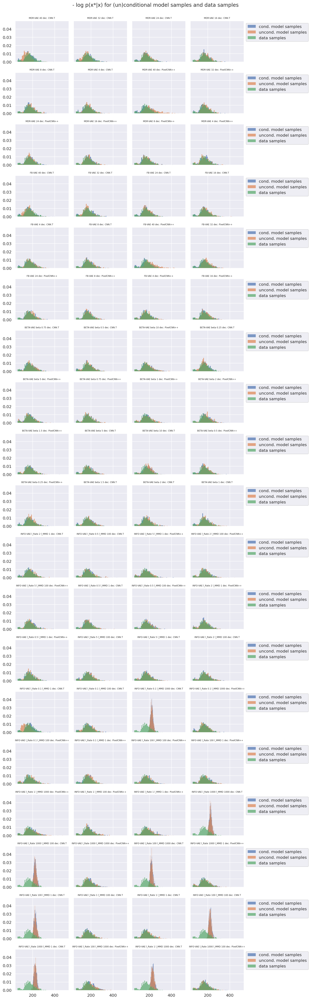

In [7]:
hist_kwargs = dict(lw=0, alpha=0.7, density=True, bins=40)

nplots = len(res_dict.keys()) - 1
ncols = 4
nrows = int(np.ceil(nplots // ncols))

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(3*ncols, 2*nrows), sharex=True, sharey=True)

for i, (run_name, res) in enumerate(res_dict.items()):
    if run_name == "data_group": continue
    
    row = i // ncols
    col = i % ncols
    
    axs[row, col].hist(np.array(res["min_log_p_xs_x_cond"]).flatten(), label="cond. model samples", **hist_kwargs)
    axs[row, col].hist(np.array(res["min_log_p_xs_x_uncond"]).flatten(), label="uncond. model samples", **hist_kwargs)
    axs[row, col].hist(np.array(res_dict["data_group"]["min_log_p_xs_x_cond"]).flatten(), label="data samples", **hist_kwargs)
    axs[row, col].set_title(run_name, size=6)
    if col == ncols - 1:
        axs[row, col].legend(loc=(1.04, 0.5))

plt.suptitle("- log p(x*|x) for (un)conditional model samples and data samples", size=14, y=1.0)
plt.tight_layout()

# - log p(x\*|x, y\*) model groups & data group

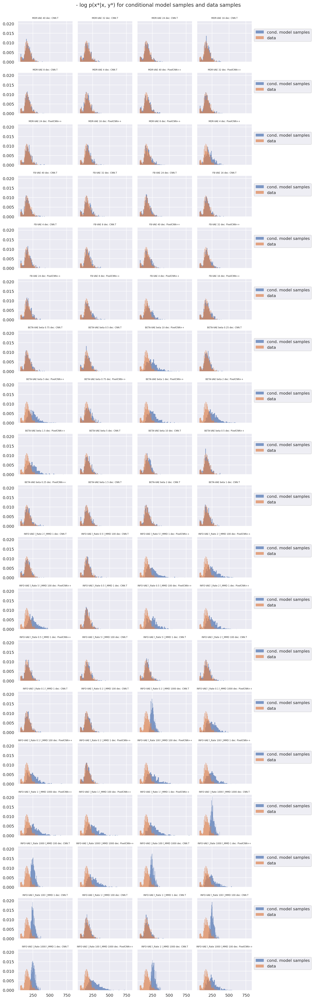

In [8]:
hist_kwargs = dict(lw=0, alpha=0.7, density=True, bins=40)

nplots = len(res_dict.keys()) - 1
ncols = 4
nrows = int(np.ceil(nplots // ncols))

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(3*ncols, 2*nrows), sharex=True, sharey=True)

for i, (run_name, res) in enumerate(res_dict.items()):
    if run_name == "data_group": continue
    
    row = i // ncols
    col = i % ncols
    
    axs[row, col].hist(np.array(res["min_log_p_xs_x_ys_cond"]).flatten(), label="cond. model samples", **hist_kwargs)
    axs[row, col].hist(np.array(res_dict["data_group"]["min_log_p_xs_x_ys_cond"]).flatten(), label="data", **hist_kwargs)
    axs[row, col].set_title(run_name, size=6)
    
    if col == ncols - 1:
        axs[row, col].legend(loc=(1.04, 0.5))

plt.suptitle("- log p(x*|x, y*) for conditional model samples and data samples", size=14, y=1.0)
plt.tight_layout()

# - log p(y\*|x\*, x) model groups & data group

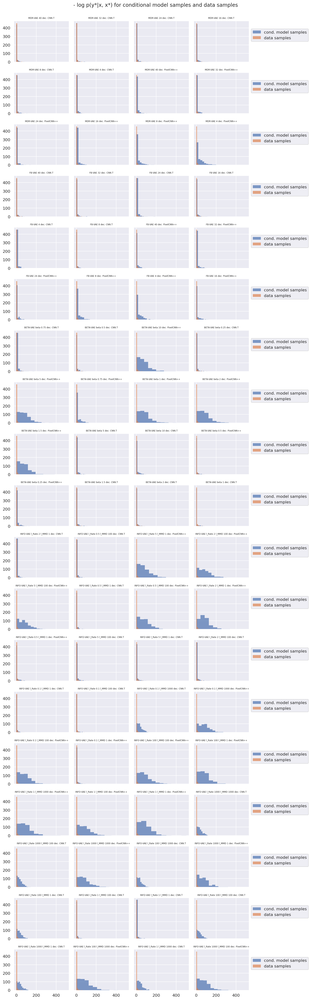

In [9]:
hist_kwargs = dict(lw=0, alpha=0.7)

nplots = len(res_dict.keys()) - 1
ncols = 4
nrows = int(np.ceil(nplots // ncols))

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(3*ncols, 2*nrows), sharex=True, sharey=True)

for i, (run_name, res) in enumerate(res_dict.items()):
    if run_name == "data_group": continue
    
    row = i // ncols
    col = i % ncols
    
    axs[row, col].hist(np.array(res["min_log_p_y_p_xs_x_cond"]).flatten(), label="cond. model samples", **hist_kwargs)
    axs[row, col].hist(np.array(res_dict["data_group"]["min_log_p_y_p_xs_x_cond"]).flatten(), label="data samples", **hist_kwargs)
    axs[row, col].set_title(run_name, size=6)
    if col == ncols - 1:
        axs[row, col].legend(loc=(1.04, 0.5))

plt.suptitle("- log p(y*|x, x*) for conditional model samples and data samples", size=14, y=1.0)
plt.tight_layout()

# Load basic statistics for experiments (MMD, R, D, etc)

In [10]:
basic_stats_df = pd.read_csv("basic_stats_runs.csv", index_col=0)

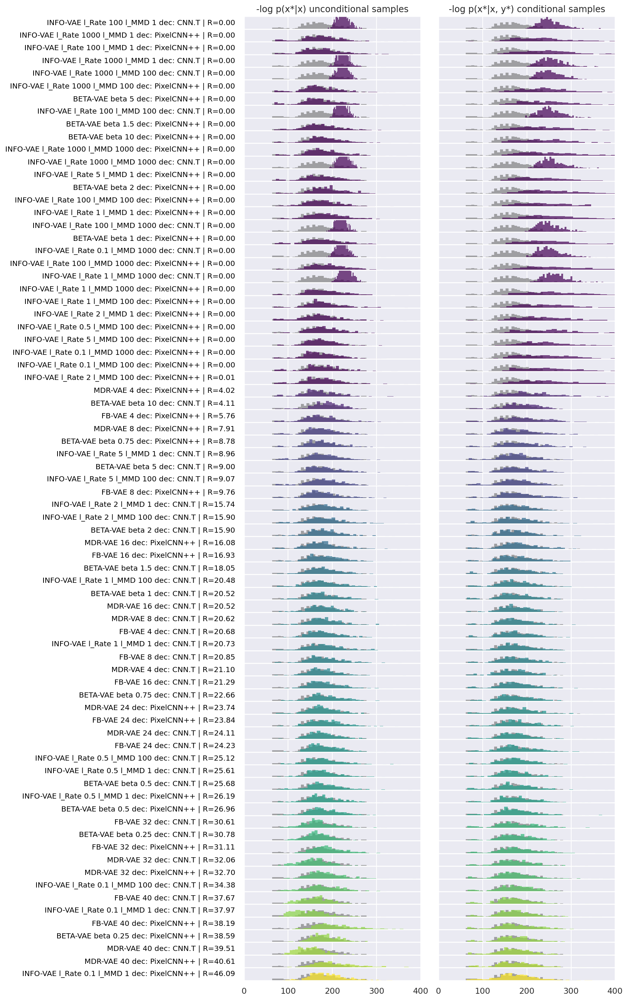

In [11]:
# ----------------------------------------------------------------------------------------------------
# sort_on, sort_name, sort_ascend = 'mmd_redo_valid', 'MMD', True                  # valid MMD
# sort_on, sort_name, sort_ascend = 'valid elbo mean', 'ELBO', True                # valid ELBO
sort_on, sort_name, sort_ascend = 'valid kl_prior_post mean', 'R', True          # valid R
# sort_on, sort_name, sort_ascend = 'valid distortion mean', 'D', True             # valid D mean
# sort_on, sort_name, sort_ascend = 'surpr_sample', 'surpr. samples', True         # LL samples
# sort_on, sort_name, sort_ascend = 'surpr_data_valid', 'surpr. data', True        # LL valid data samples
# sort_on, sort_name, sort_ascend = 'surpr_recons_valid', 'surpr. recons', True    # LL valid reconstructions

# ----------------------------------------------------------------------------------------------------
# model_cols = ['min_log_p_xs_x_cond', 'min_log_p_xs_x_uncond', 'min_log_p_xs_x_ys_cond', 'min_log_p_y_p_xs_x_cond']
model_cols = ['min_log_p_xs_x_uncond', 'min_log_p_xs_x_ys_cond'] #"min_log_p_xs_x_cond", 
model_col_names = ["-log p(x*|x) unconditional samples",  "-log p(x*|x, y*) conditional samples"] #"-log p(x*|x) conditional samples",

ncols = len(model_cols)
nrows = len(basic_stats_df)
# nrows = 4

hist_kwargs = dict(lw=0, alpha=0.7, density=True, bins=40)

df_sort_on = basic_stats_df.sort_values(sort_on, ascending=sort_ascend)[sort_on]
sort_on_labels, sort_on_values = df_sort_on.index, df_sort_on.values
labels = [f"{l} | {sort_name}={v:.2f}" for l, v in zip(sort_on_labels, sort_on_values)]

fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*6, nrows*0.25), sharex=True, sharey=True)

minima, maxima = min(sort_on_values), max(sort_on_values)
norm = matplotlib.colors.Normalize(vmin=minima, vmax=maxima, clip=True)
mapper = cm.ScalarMappable(norm=norm, cmap=cm.viridis)

for col, col_name in enumerate(model_cols):
    for row, group_name in enumerate(sort_on_labels):
        
        color = mapper.to_rgba(sort_on_values[row])
        
        axs[row, col].hist(res_dict["data_group"][model_cols[col]], color="grey", **hist_kwargs)
        axs[row, col].hist(res_dict[group_name][model_cols[col]], color=color, **hist_kwargs)
        
        if col == 0:
            axs[row, col].text(-0.05, .5, labels[row], color='black', fontsize=10, ha="right", va="center", 
                               transform=axs[row, col].transAxes)
        
        axs[row, col].set_yticks([])
        axs[row, col].set_ylim([0, 0.02])
        axs[row, col].set_xlim([0, 400])
        
        if row == 0:
            axs[row, col].set_title(model_col_names[col])
        
#         if row == 3: break

plt.tight_layout()
plt.subplots_adjust(wspace=0.1, hspace=0.0)


In [9]:
class DPMixture:
    def __init__(self, group_names: list, observations: list, obs_dist="normal",
                 DP_alpha=1., num_comps=5,
                 num_samples=1000, num_chains=1, num_warmup=100):

        self.DP_alpha = DP_alpha
        self.T = num_comps
        
        self.obs_dist = obs_dist
        
        # [G]
        self.group_names = group_names
        self.G = len(group_names)
        
        self.group_name_to_id = {n:i for i, n in enumerate(group_names)}
        self.group_id_to_name = {i:n for i, n in enumerate(group_names)}
        
        self.N = sum(len(y) for y in observations)
        
        # [N]
        self.obs_g = np.concatenate([[g] * len(y) for g, y in enumerate(observations)])
        self.obs_y = np.concatenate(observations)
        
        #print("obs g shape", self.obs_g.shape)
        #print("obs y shape", self.obs_y.shape)

        self.num_samples = num_samples
        self.num_chains = num_chains
        self.num_warmup = num_warmup

        self.rng_key = random.PRNGKey(0)

        nuts_kernel = NUTS(self.model)
        self.mcmc = MCMC(nuts_kernel, num_samples=num_samples, num_warmup=num_warmup, num_chains=num_chains)

        self.prior_predictive = None
        self.posterior_predictive = None
        self.posterior_samples = None

    @classmethod
    def mix_weights(cls, beta):
        beta1m_cumprod = (1 - beta).cumprod(-1)
        return jnp.pad(beta, ((0, 0), (0, 1)), constant_values=1) * jnp.pad(beta1m_cumprod, ((0, 0), (1, 0)), constant_values=1)

    @classmethod
    def stick_break_sorting(cls, beta):
        beta1m_cumprod = (1 - beta).cumprod(-1)
        return jnp.pad(beta, (0, 1), constant_values=1) * jnp.pad(beta1m_cumprod, (1, 0), constant_values=1)
    
    def model(self, y=None):
        """
        Pyro joint distribution.
        
        Parameter:
        
        y: observations as returned by self.prepare or None. 
            If None, the 'obs' node of the graphical model will be resampled.
        """

        N, G, T = self.N, self.G, self.T
        
        loc, scale, df = 0.0, 0.0, 0.0
        
        # Components
        with numpyro.plate("components", T):  
            if self.obs_dist == "binomial":
                lamb = numpyro.sample("lamb", dist.Beta(1.0, 1.0))
                probs = numpyro.deterministic("probs", self.stick_break_sorting(lamb))
                
                # probs = numpyro.deterministic("probs", jnp.cumprod(lamb, axis=-1))
                # probs = numpyro.deterministic("probs", jnp.sort(lamb, axis=-1))
                # probs = jnp.sort(probs, axis=-1)
            
            # loc & scale for log normal, normal and student T
            elif "normal" in self.obs_dist or self.obs_dist == "student_t":
                if self.obs_dist == "log_normal":
                    mean = 0.0
                else:
                    mean = np.mean(self.obs_y)
                
                # [T]
                loc = numpyro.sample('loc', dist.Normal(mean, 1.0))
                idx = jnp.argsort(loc, -1) #, -1
                loc = loc[idx]
                
                # scale = numpyro.sample('scale', dist.Gamma(1, 10))
                scale = numpyro.sample('scale', dist.Uniform(0.1, 20))
                # scale = scale[idx]
                
                # degrees of freedom
                if self.obs_dist == "student_t":
                    df = numpyro.sample("student_df", dist.Exponential(rate=1.0 / 10.0))
                    # df = df[idx]
            
            else:
                raise NotImplementedError
            
        
        # Sample mixing weights    
        with numpyro.plate("DPs", G):
            # [G, T-1]
            beta = numpyro.sample("beta", dist.Beta(np.ones(1), np.ones(1) * self.DP_alpha).expand((T-1,)).to_event(1))
        
        # [G, T]
        omega = numpyro.deterministic("omega", self.mix_weights(beta))
        
        loc_z, scale_z, df_z = 0.0, 0.0, 0.0
        with numpyro.plate("observations", N):
            # Choose component
            z = numpyro.sample("z", dist.Categorical(probs=omega[self.obs_g])) 
            
            if "normal" in self.obs_dist or self.obs_dist == "student_t":
                loc_z = numpyro.deterministic("loc_z", loc[z])
                scale_z = numpyro.deterministic("scale_z", scale[z])
            
                if self.obs_dist == "student_t":
                    df_z = numpyro.deterministic("df_z", df[z])
                
            elif self.obs_dist == "binomial":
                probs_z = numpyro.deterministic("probs_z", probs[z])
            
            # Construct the likelihood function 
            if self.obs_dist == "normal":
                sampled_y = numpyro.sample("y", dist.Normal(loc=loc_z, scale=scale_z), obs=y)
            
            elif self.obs_dist == "log_normal":
                sampled_y = numpyro.sample("y", dist.LogNormal(loc=loc_z, scale=scale_z), obs=y)
            
            elif self.obs_dist == "student_t":
                sampled_y = numpyro.sample("y", dist.StudentT(loc=loc_z, scale=scale_z, df=df_z), obs=y)
            
            elif self.obs_dist == "binomial":
                sampled_y = numpyro.sample("y", dist.Binomial(probs=probs_z, total_count=28*28), obs=y)
            
            elif self.obs_dist == "truncated_normal":
                sampled_y = numpyro.sample("y", dist.TruncatedNormal(low=0.0, loc=loc_z, scale=scale_z), obs=y)
            
            else:
                raise NotImplementedError
            
            #print("sampled y", sampled_y.shape)
            
            return sampled_y

    def run(self):
        self.mcmc.run(self.rng_key, y=self.obs_y)
        self.mcmc.print_summary()
        self.posterior_samples = self.mcmc.get_samples(group_by_chain=False)
        print("posterior samples shapes:")
        for k, v in self.posterior_samples.items():
            print(k, v.shape)

    def make_prior_predictive(self, num_prior_samples=100):        
        if self.prior_predictive is None:
            self.prior_predictive = Predictive(self.model, num_samples=num_prior_samples)

    def draw_prior_predictions(self):
        if self.prior_predictive is None:
            self.make_prior_predictive()
        rng_key, rng_key_ = random.split(self.rng_key)        
        return self.prior_predictive(rng_key_, y=None)["y"]

    def make_posterior_predictive(self):
        if self.posterior_samples is None:
            raise RuntimeError("You need to run the sampler first")        
        if self.posterior_predictive is None:
            self.posterior_predictive = Predictive(self.model, self.posterior_samples)        

    def draw_posterior_predictions(self, plot=False):
        if self.posterior_predictive is None:
            self.make_posterior_predictive()        
        rng_key, rng_key_ = random.split(self.rng_key)
        return self.posterior_predictive(rng_key_, y=None)["y"]

In [10]:
def plot_all_groups_preds_obs(self):
    post_preds = self.draw_posterior_predictions()

    N_groups = len(self.group_names)

    ncols = 5
    nrows = int(np.ceil(N_groups / 5))

    fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(3*ncols, 2*nrows))

    for g in range(N_groups):
        row, col = g // ncols, g % ncols

        preds_g = post_preds[:, self.obs_g == g]
        obs_g = self.obs_y[self.obs_g == g]

        axs[row, col].hist(np.array(preds_g).flatten(), bins=40, density=True, lw=0, label="preds", alpha=0.7, color="blue")
        axs[row, col].hist(np.array(obs_g).flatten(), bins=40, density=True, lw=0, label="obs", alpha=0.7, color="lightblue")

        axs[row, col].set_title(self.group_names[g], size=8)

        if (col == ncols-1) and (row == 0):
            axs[row, col].legend(loc=(1.05, 0.8))

    plt.tight_layout()
    plt.show()

def plot_model_data_preds_obs(self):
    post_preds = self.draw_posterior_predictions()

    ncols = 3
    nrows = 1

    c_dict = {
        "data preds": "green",
        "data obs": "lightgreen",
        "model preds": "blue",
        "model obs": "lightblue"
    }

    fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(5*ncols, 3*nrows))

    data_group_id = self.group_names.index("data_group")

    preds_model_groups = post_preds[:, self.obs_g != data_group_id]
    obs_model_groups = self.obs_y[self.obs_g != data_group_id]

    preds_data_group = post_preds[:, self.obs_g == data_group_id]
    obs_data_group = self.obs_y[self.obs_g == data_group_id]

    axs[0].hist(np.array(preds_model_groups).flatten(), bins=40, density=True, lw=0, label="model preds", color=c_dict["model preds"], alpha=0.7)
    axs[0].hist(np.array(obs_model_groups).flatten(), bins=40, density=True, lw=0, label="model obs", color=c_dict["model obs"], alpha=0.7)
    axs[0].hist(np.array(preds_data_group).flatten(), bins=40, density=True, lw=0, label="data preds", color=c_dict["data preds"], alpha=0.7)
    axs[0].hist(np.array(obs_data_group).flatten(), bins=40, density=True, lw=0, label="data obs", color=c_dict["data obs"], alpha=0.7)

    axs[1].hist(np.array(preds_data_group).flatten(), bins=40, density=True, lw=0, label="data preds", color=c_dict["data preds"], alpha=0.7)
    axs[1].hist(np.array(obs_data_group).flatten(), bins=40, density=True, lw=0, label="data obs", color=c_dict["data obs"], alpha=0.7)

    axs[2].hist(np.array(preds_model_groups).flatten(), bins=40, density=True, lw=0, label="model preds", color=c_dict["model preds"], alpha=0.7)
    axs[2].hist(np.array(obs_model_groups).flatten(), bins=40, density=True, lw=0, label="model obs", color=c_dict["model obs"], alpha=0.7)

    axs[0].legend()
    axs[1].legend()
    axs[2].legend()

    axs[0].set_title("Model and data groups obs & preds")
    axs[1].set_title("Data group obs & preds")
    axs[2].set_title("Model group obs & preds")

    plt.tight_layout()
    plt.show()
    


def plot_component_dist_and_data_group_distance(self, mmds=None):
    # [N_s, N_g, N_c]
    omega = self.posterior_samples["omega"] 
    data_group_id = self.group_names.index("data_group")
    omega_data_group = omega[:, data_group_id, :]

    omega_tensor = torch.FloatTensor(np.array(omega))
    omega_data_group_tensor = torch.FloatTensor(np.array(omega_data_group)).unsqueeze(1)
    
    omega_dists = td.Categorical(probs=omega_tensor)
    omega_data_group_dists = td.Categorical(probs=omega_data_group_tensor)
    
    # [N_s, N_g, N_c] -> [N_s, N_g] -> [N_g]
    kl = td.kl_divergence(omega_data_group_dists, omega_dists)
    kl_avg = kl.mean(axis=0) # avg sample dim
    
    kl_order = np.argsort(kl_avg.numpy().flatten())
    labels_reorder = np.array(self.group_names)[kl_order]

    x = np.arange(len(kl_order))

    fig, ax = plt.subplots(figsize=(14, 6))
    
    if mmds is None:
        ax.bar(x, kl_avg[kl_order], 0.4, lw=0, label="KL div.")
    else:
        mmds_reorder = np.array(mmds)[kl_order]
        _ = ax.bar(x-0.2, kl_avg[kl_order], 0.4, lw=0, label="KL div.")
        _ = ax.bar(x+0.2, mmds_reorder, 0.4, lw=0, label="MMD")

    ax.set_xticks(x)
    ax.set_xticklabels(labels_reorder)

    ax.tick_params(axis='both', labelsize=8)

    for tick in ax.get_xticklabels():
        tick.set_rotation(90)

    plt.legend()
    _ = plt.suptitle(f"KL of experiment groups component assignments to data group component assignment")
    plt.show()
    
    kl_comps_data_group = dict()
    for i in range(len(labels_reorder)):
        kl_comps_data_group[labels_reorder[i]] = kl_avg[kl_order][i].item()
    
    return kl_comps_data_group

In [11]:
# stat_name = "min_log_p_y_p_xs_x_cond"
# group_names = []
# observations = []

# for k, v in res_dict.items():
#     group_names.append(k)
#     observations.append(np.array(v[stat_name][:50]))



# dp_mixture = DPMixture(
#     group_names, 
#     observations, 
#     obs_dist="student_t", 
#     DP_alpha=1., 
#     num_comps=3, 
#     num_samples=1000, 
#     num_chains=1, 
#     num_warmup=100
# )

# dp_mixture.run()

# plot_all_groups_preds_obs(dp_mixture)
# kl_component_assignments = plot_component_dist_and_data_group_distance(dp_mixture)
# kl_component_assignments_all_dps[stat] = kl_component_assignments


In [12]:
model_cols = ['min_log_p_xs_x_cond', 'min_log_p_xs_x_uncond', 'min_log_p_xs_x_ys_cond'] #, 'min_log_p_y_p_xs_x_cond'

name_dict = {
    'min_log_p_xs_x_cond': "- log p(x*|x) cond. samples", 
    'min_log_p_xs_x_uncond': "- log p(x*|x) uncond. samples",
    'min_log_p_xs_x_ys_cond': "- log p(x*|x, y*) conditional samples",
    'min_log_p_y_p_xs_x_cond': "- log p(y|x*, x) conditional samples"
}


if os.path.isfile("BDA-data-space-analysis-dp-mixtures.p"):
    dp_mixtures = pickle.load(open("BDA-data-space-analysis-dp-mixtures.p", "rb"))

else:
    dp_mixtures = dict()

    max_samples_per_group = 150

    for stat_name in model_cols:
        print(name_dict[stat_name])

        group_names = []
        observations = []

        for k, v in res_dict.items():
            group_names.append(k)
            observations.append(np.array(v[stat_name][:max_samples_per_group]))

        dp_mixture = DPMixture(
            group_names, 
            observations, 
            obs_dist="truncated_normal", 
            DP_alpha=1., 
            num_comps=3, 
            num_samples=1000, 
            num_chains=1, 
            num_warmup=100
        )

        dp_mixture.run()

        dp_mixtures[stat_name] = dp_mixture

In [51]:
import pickle

pickle.dump(dp_mixtures, open("BDA-data-space-analysis-dp-mixtures.p", "wb"))

In [52]:
for k, v in dp_mixtures[model_cols[0]].posterior_samples.items():
    print(k, v.shape)

beta (1000, 77, 2)
loc (1000, 3)
loc_z (1000, 11550)
omega (1000, 77, 3)
scale (1000, 3)
scale_z (1000, 11550)


In [53]:
dp_mixtures.keys()

dict_keys(['min_log_p_xs_x_cond', 'min_log_p_xs_x_uncond', 'min_log_p_xs_x_ys_cond'])

- log p(x*|x) cond. samples


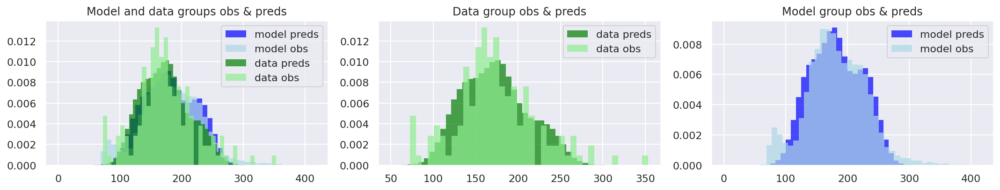

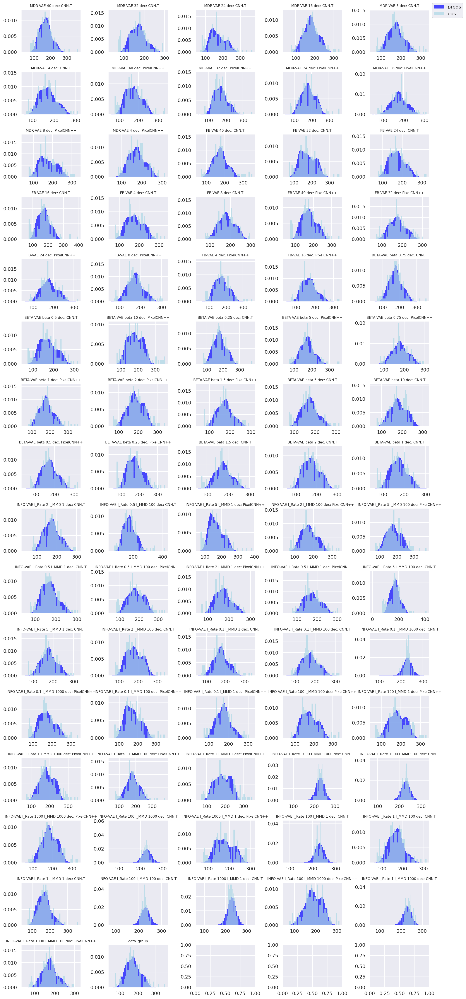

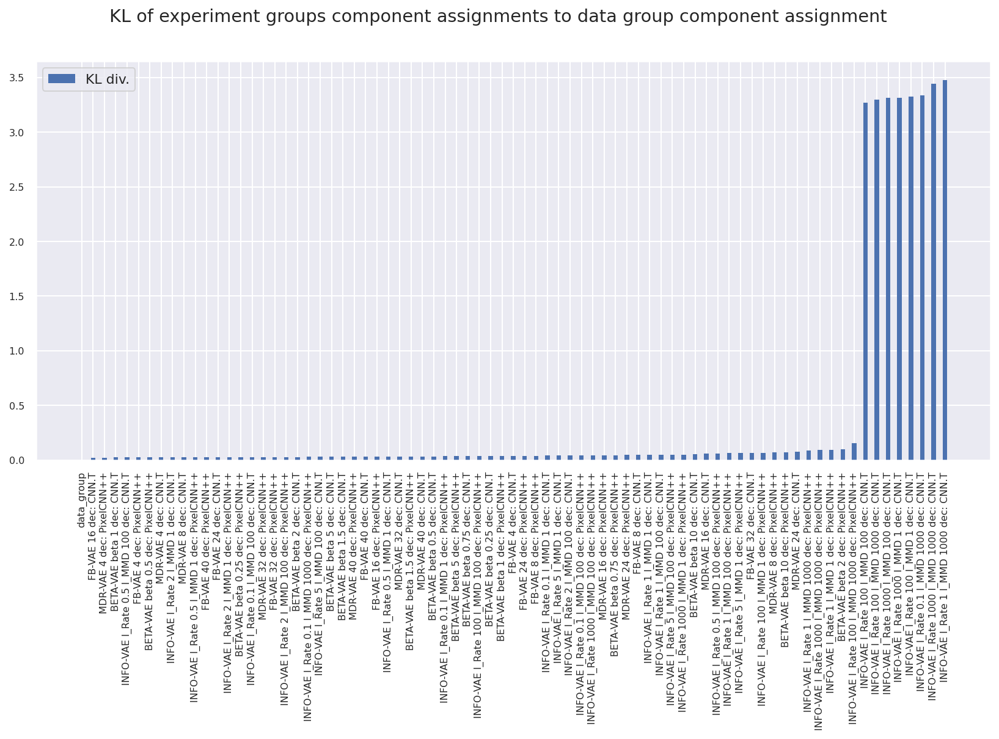

----------------------------------------------------------------------
- log p(x*|x) uncond. samples


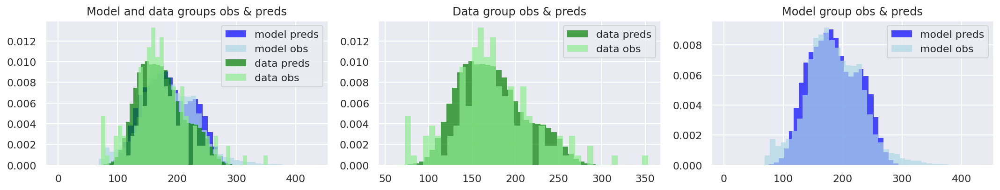

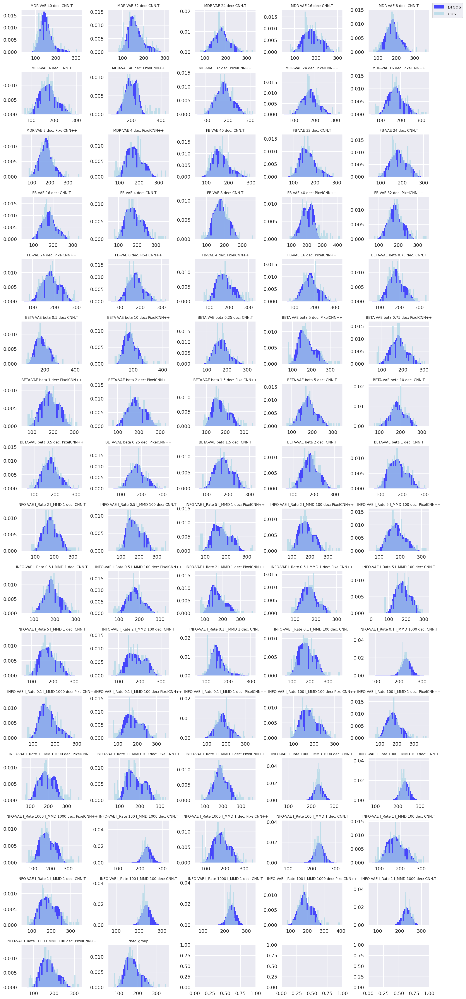

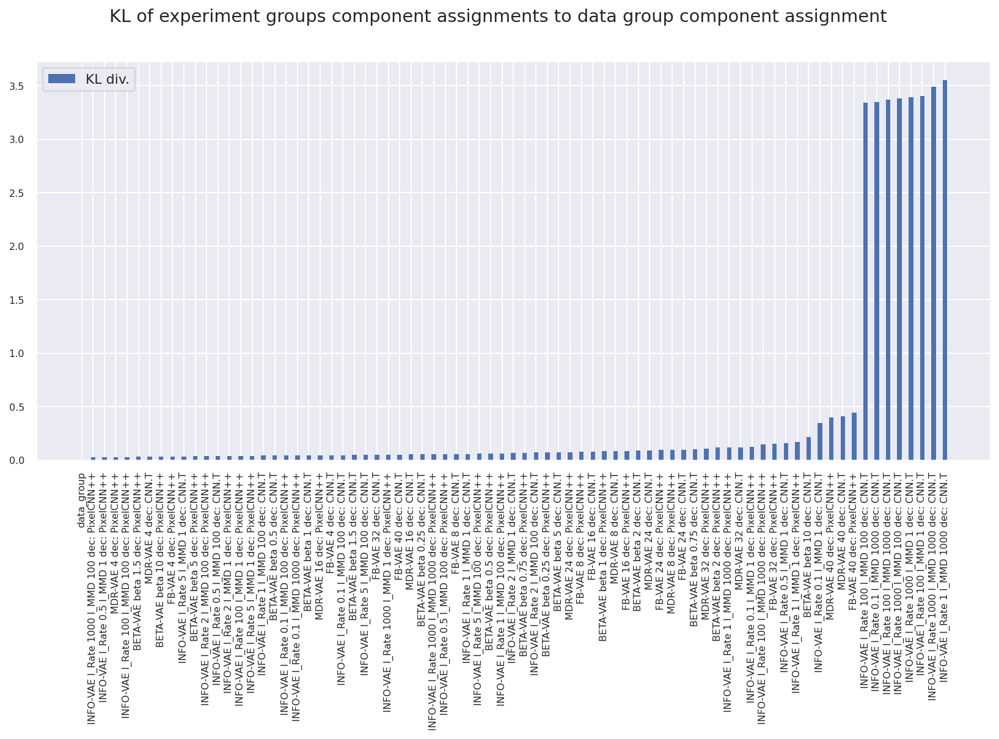

----------------------------------------------------------------------
- log p(x*|x, y*) conditional samples


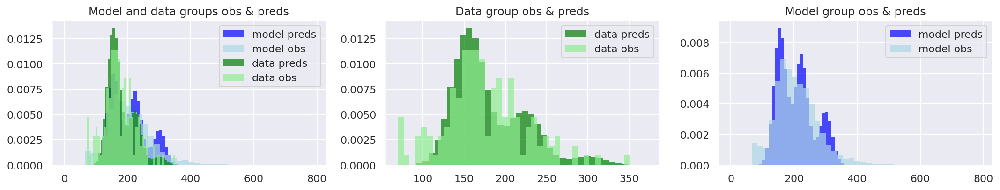

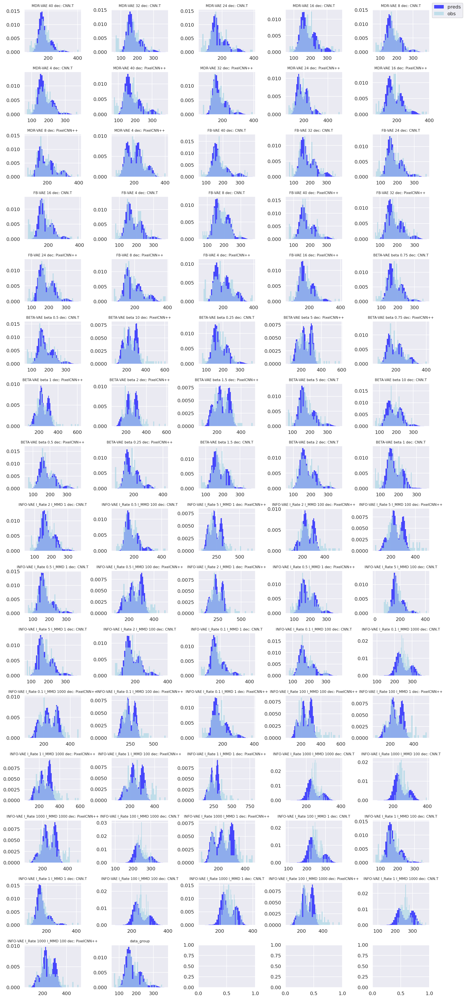

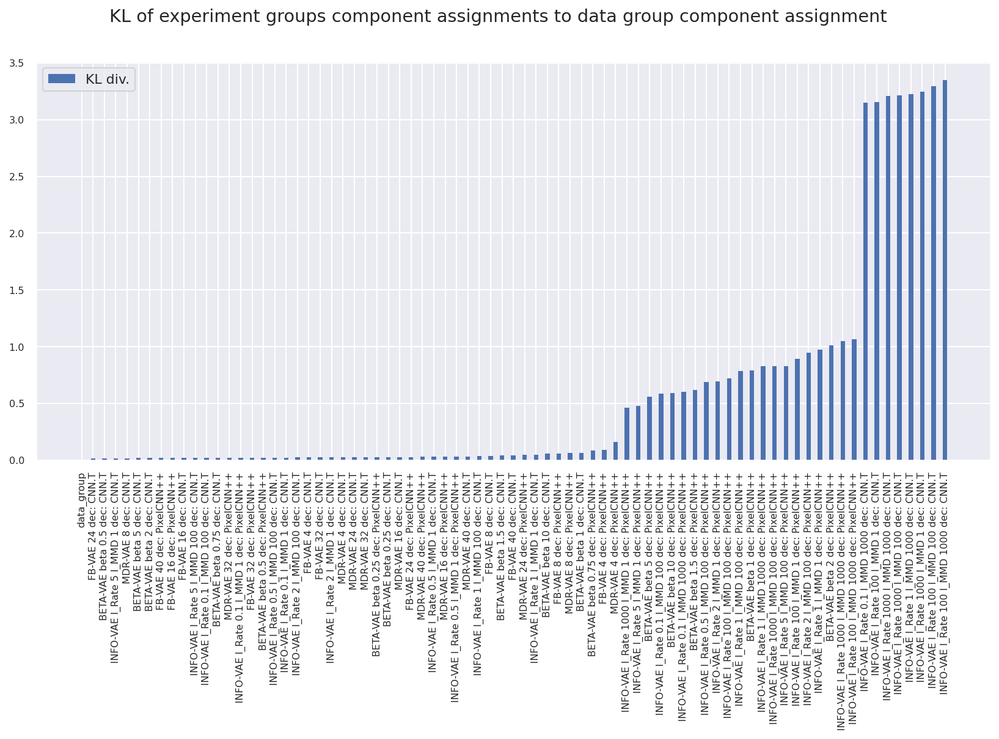

----------------------------------------------------------------------


In [17]:
kl_component_assignments_all_dps = dict()

for stat, dp_mixture in dp_mixtures.items():
    
    print(name_dict[stat])
    try:
        plot_model_data_preds_obs(dp_mixture)
        plot_all_groups_preds_obs(dp_mixture)
        kl_component_assignments = plot_component_dist_and_data_group_distance(dp_mixture)
        kl_component_assignments_all_dps[stat] = kl_component_assignments
    except:
        print("error")
    print("-" * 70)

# Estimate KL between densities from Mixture Model

In [18]:
import torch.distributions as td


def estimate_kl_densities_dp_mixture(dp_mixture):
    # beta (1000, 77, 2)
    # loc (1000, 3)
    # loc_z (1000, 3850)
    # omega (1000, 77, 3)
    # scale (1000, 3)
    # scale_z (1000, 3850)

    # --------------------------------------------------------------------------------------------
    # Sample from the posterior predictive of the data group

    # [S, G, T]
    omega = dp_mixture.posterior_samples["omega"]
    S, G, T = omega.shape

    # [S, T]
    loc, scale = dp_mixture.posterior_samples["loc"], dp_mixture.posterior_samples["scale"]

    idx_perm_1 = np.random.permutation(S)
    idx_perm_2 = np.random.permutation(S)

    data_group_idx = dp_mixture.group_names.index("data_group")

    # Use the first indices to sample mixing coefficients of the data group
    sampled_omega = omega[idx_perm_1, data_group_idx, :]
    assert sampled_omega.shape == (S, 3), f"shape should be (S, 3), currently: {sampled_omega.shape}"
    assert sampled_omega.sum(axis=-1).mean() == 1.0, f"the sum of the mixing weights should be 1, currently: {sampled_omega.sum(dim=-1).mean()}"
    sampled_components = td.Categorical(probs=torch.Tensor(np.array(sampled_omega))).sample().numpy()

    # Use the second indices to sample component parameters of the sampled components
    sampled_loc, sampled_scale = loc[idx_perm_2, sampled_components], scale[idx_perm_2, sampled_components]
    sample_q_x = td.Normal(loc=torch.Tensor(np.array(sampled_loc)), scale=torch.Tensor(np.array(sampled_scale))).sample().numpy()

    # --------------------------------------------------------------------------------------------
    # Assess the samples under the densities of the data group 
    idx_perm_1 = np.random.permutation(S)
    idx_perm_2 = np.random.permutation(S)

    sampled_omega = omega[idx_perm_1, data_group_idx, :]
    sampled_loc, sampled_scale = loc[idx_perm_2, :], scale[idx_perm_2, :]

    q_mix = td.Categorical(probs=torch.Tensor(np.array(sampled_omega)))
    q_comp = td.Normal(loc=torch.Tensor(np.array(sampled_loc)), scale=torch.Tensor(np.array(sampled_scale)))

    # [S, T]
    q_mixtures = td.MixtureSameFamily(q_mix, q_comp)
    # [S]
    log_q_samples = q_mixtures.log_prob(torch.Tensor(np.array(sample_q_x))).numpy()
    log_q_samples_avg = logsumexp(log_q_samples) - np.log(S)

    kl_density_est = dict()

    # --------------------------------------------------------------------------------------------
    # Assess the samples under the densities of the model groups
    for model_group in dp_mixture.group_names:
        if model_group == "data_group": continue
        model_group_idx = dp_mixture.group_names.index(model_group)

        idx_perm_1 = np.random.permutation(S)
        idx_perm_2 = np.random.permutation(S)

        sampled_omega = omega[idx_perm_1, model_group_idx, :]
        sampled_loc, sampled_scale = loc[idx_perm_2, :], scale[idx_perm_2, :]

        p_mix = td.Categorical(probs=torch.Tensor(np.array(sampled_omega)))
        p_comp = td.Normal(loc=torch.Tensor(np.array(sampled_loc)), scale=torch.Tensor(np.array(sampled_scale)))

        # [S, T]
        p_mixtures = td.MixtureSameFamily(p_mix, p_comp)
        # [S]
        log_p_samples = p_mixtures.log_prob(torch.Tensor(np.array(sample_q_x))).numpy()
        log_p_samples_avg = logsumexp(log_p_samples) - np.log(S)

        kl_est = float(log_q_samples_avg - log_p_samples_avg)

        kl_density_est[model_group] = kl_est
    
    return kl_density_est
    
kl_densities_all_dps = dict()
for stat in model_cols:
    kl_density_est = estimate_kl_densities_dp_mixture(dp_mixtures[stat])
    kl_densities_all_dps[stat] = kl_density_est

- log p(x*|x) cond. samples


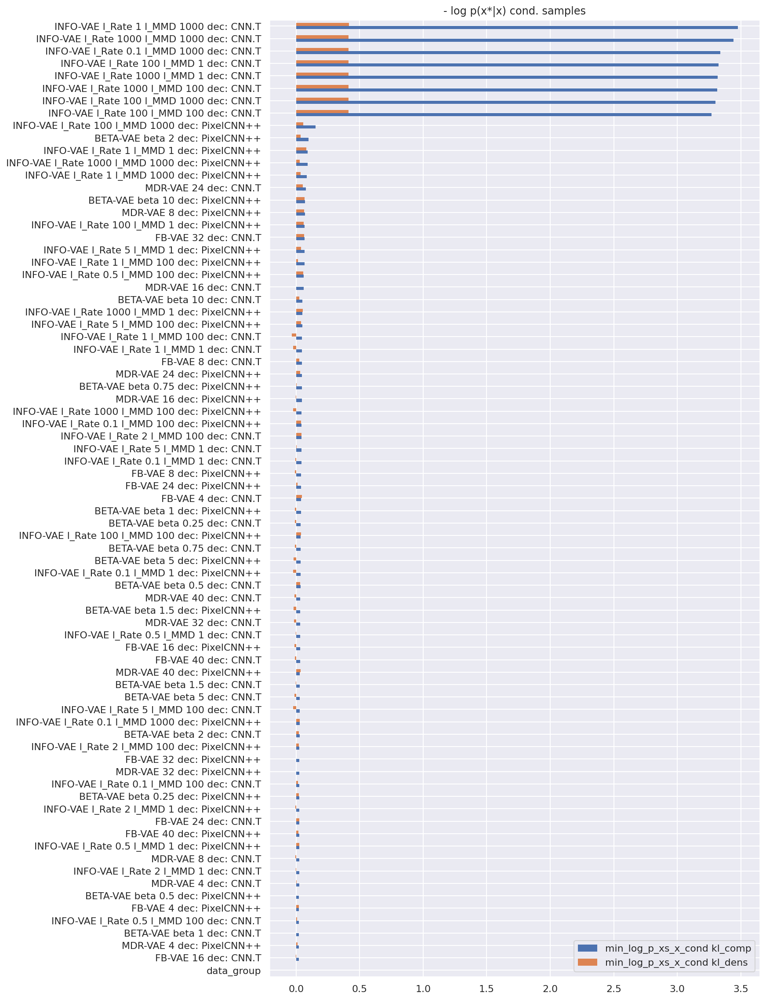

- log p(x*|x) uncond. samples


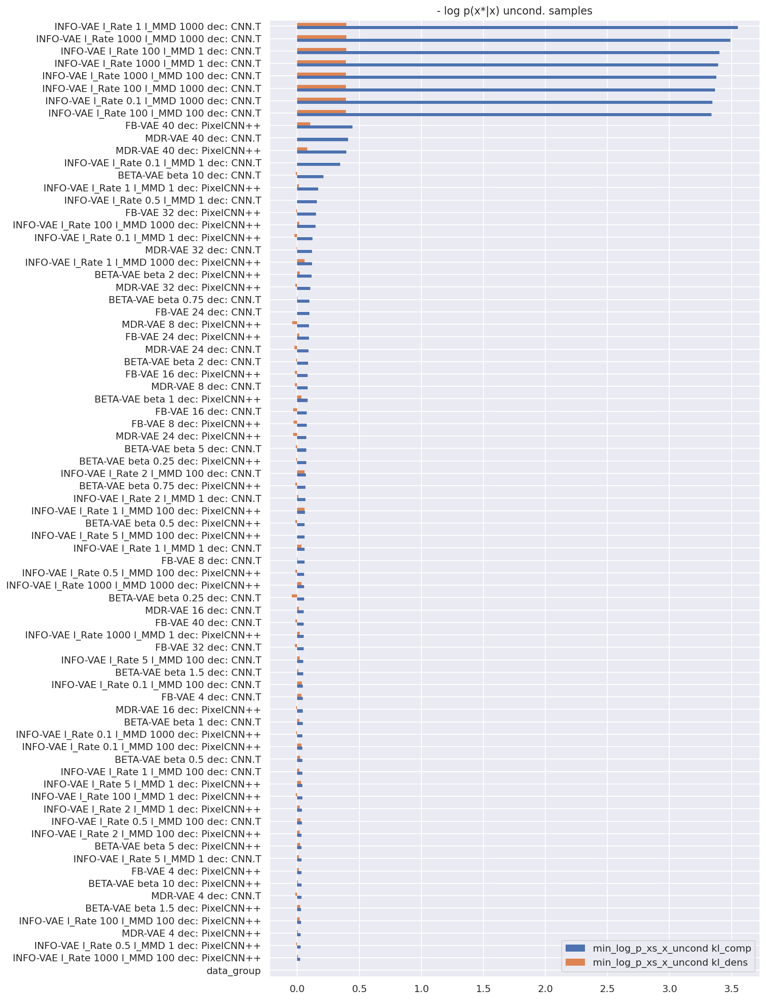

- log p(x*|x, y*) conditional samples


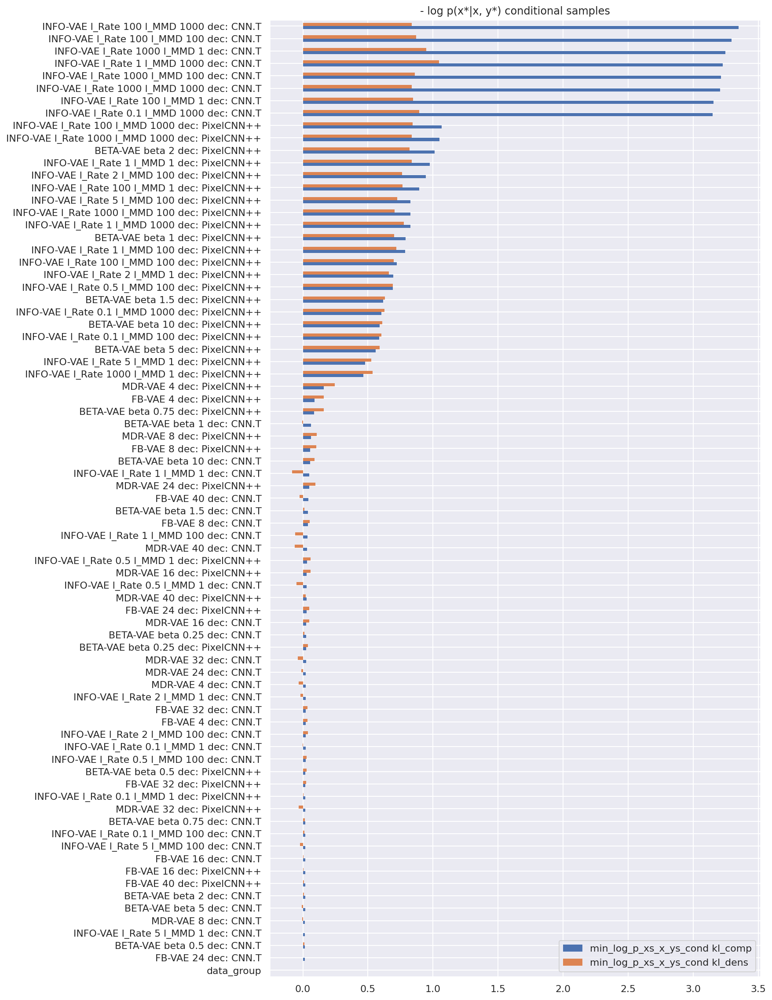

In [19]:
kl_dens_df = pd.DataFrame(kl_densities_all_dps)
kl_comp_df = pd.DataFrame(kl_component_assignments_all_dps)

kl_df = kl_comp_df.join(kl_dens_df, lsuffix=' kl_comp', rsuffix=" kl_dens")
for stat in model_cols:
    print(name_dict[stat])
    fig, ax = plt.subplots(figsize=(10, 20))
    df_select = kl_df[[stat + " kl_comp", stat + " kl_dens"]]
    df_select = df_select.sort_values(stat + " kl_comp")
    df_select.plot.barh(rot=0, lw=0, ax=ax)
    ax.set_title(name_dict[stat])
    plt.show()

In [20]:
dens_cols = [c for c in kl_df.columns if "kl_dens" in c]
comp_cols = [c for c in kl_df.columns if "kl_comp" in c]

kl_df["kl_comp sum"] = kl_df[comp_cols].sum(axis=1)
kl_df["kl_dens sum"] = kl_df[dens_cols].sum(axis=1)

kl_df

,min_log_p_xs_x_cond kl_comp,min_log_p_xs_x_uncond kl_comp,min_log_p_xs_x_ys_cond kl_comp,min_log_p_xs_x_cond kl_dens,min_log_p_xs_x_uncond kl_dens,min_log_p_xs_x_ys_cond kl_dens,kl_comp sum,kl_dens sum
data_group,0.000000,0.000000,0.000000,nan,nan,nan,0.000000,0.000000
FB-VAE 16 dec: CNN.T,0.021200,0.075808,0.017520,-0.003074,-0.032054,0.005354,0.114529,-0.029774
MDR-VAE 4 dec: PixelCNN++,0.022513,0.026926,0.160538,0.009818,0.005227,0.245229,0.209977,0.260273
BETA-VAE beta 1 dec: CNN.T,0.023062,0.043355,0.062770,0.001460,0.016694,-0.005319,0.129188,0.012835
INFO-VAE l_Rate 0.5 l_MMD 100 dec: CNN.T,0.023160,0.036284,0.020473,0.008389,0.027630,0.028373,0.079918,0.064393
...,...,...,...,...,...,...,...,...
INFO-VAE l_Rate 1000 l_MMD 1 dec: CNN.T,3.317687,3.392313,3.248130,0.411235,0.392291,0.946973,9.958129,1.750500
INFO-VAE l_Rate 100 l_MMD 1 dec: CNN.T,3.325151,3.400951,3.154152,0.413221,0.394989,0.846333,9.880255,1.654543
INFO-VAE l_Rate 0.1 l_MMD 1000 dec: CNN.T,3.339249,3.347050,3.147663,0.414104,0.390898,0.893499,9.833962,1.698501
INFO-VAE l_Rate 1000 l_MMD 1000 dec: CNN.T,3.441191,3.491316,3.206780,0.412736,0.393963,0.838024,10.139288,1.644723


[]

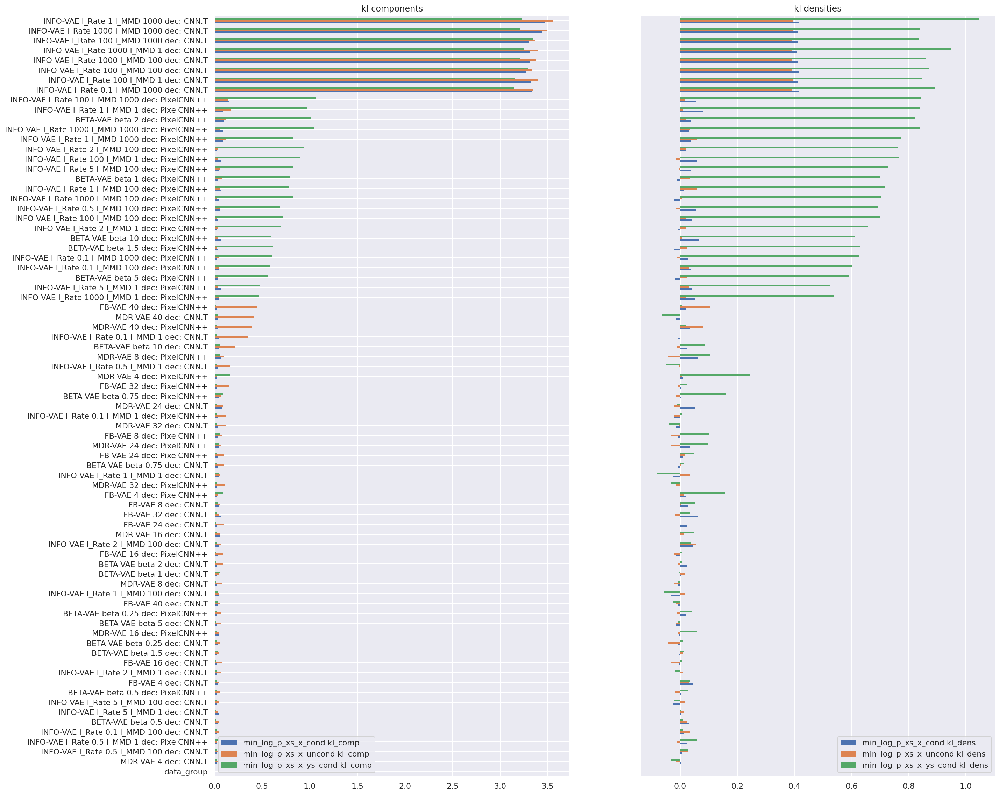

In [21]:
fig, axs = plt.subplots(ncols=2, figsize=(20, 20))

kl_df = kl_df.sort_values("kl_comp sum")
kl_df_select = kl_df[comp_cols]
kl_df_select.plot.barh(rot=0, lw=0, ax=axs[0])
axs[0].set_title("kl components")

# kl_df = kl_df.sort_values("kl_dens sum")
kl_df_select = kl_df[dens_cols]
kl_df_select.plot.barh(rot=0, lw=0, ax=axs[1])
axs[1].set_title("kl densities")
axs[1].set_yticks([])

# Wasserstein distance

<AxesSubplot:>

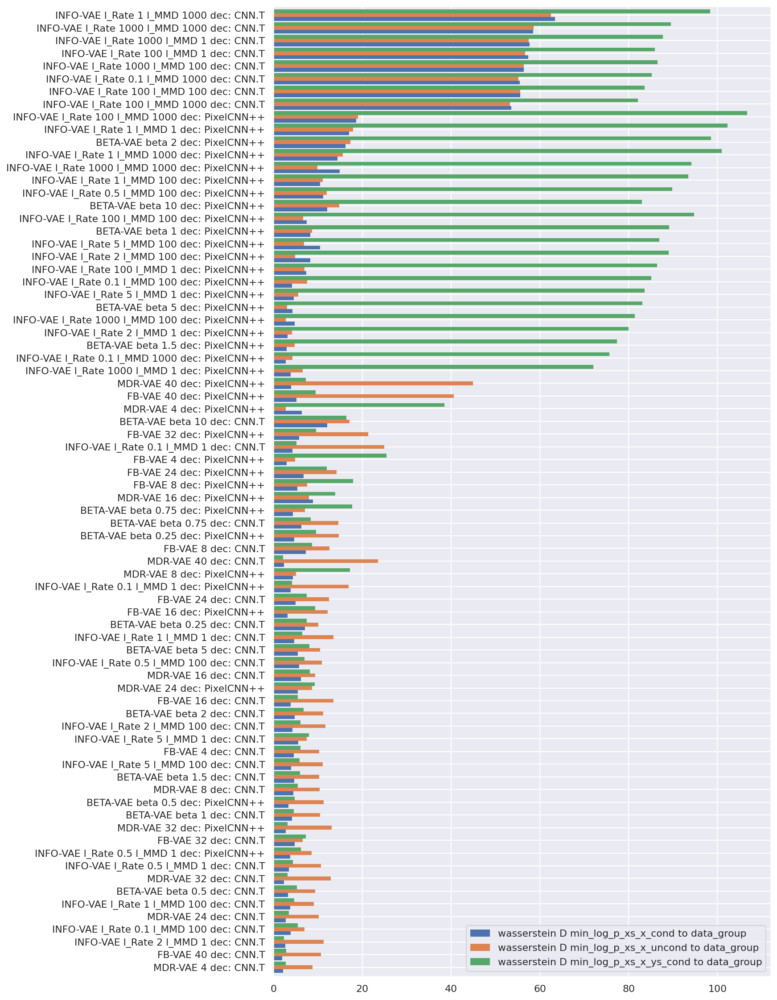

In [22]:
# model_cols = ['min_log_p_xs_x_cond', 'min_log_p_xs_x_uncond', 'min_log_p_xs_x_ys_cond', 'min_log_p_y_p_xs_x_cond']

wass_dists = dict()

for k, v in res_dict.items():
    if k is not "data_group":
        wass_dists[k] = dict()
        for stat_name, stat in v.items():
            if stat_name != "run_name" and stat_name != 'min_log_p_y_p_xs_x_cond':
                w = stats.wasserstein_distance(stat, res_dict["data_group"][stat_name])
                wass_dists[k]["wasserstein D " + stat_name + " to data_group"] = w

fig, ax = plt.subplots(figsize=(10, 20))
wasserstein_df = pd.DataFrame(wass_dists).transpose()
wasserstein_df["wasserstein_sum"] = wasserstein_df.sum(axis=1)
wasserstein_df = wasserstein_df.sort_values("wasserstein_sum")
wasserstein_df.drop("wasserstein_sum", axis=1).plot(kind="barh", lw=0, width=0.9, ax=ax, rot=0)


[]

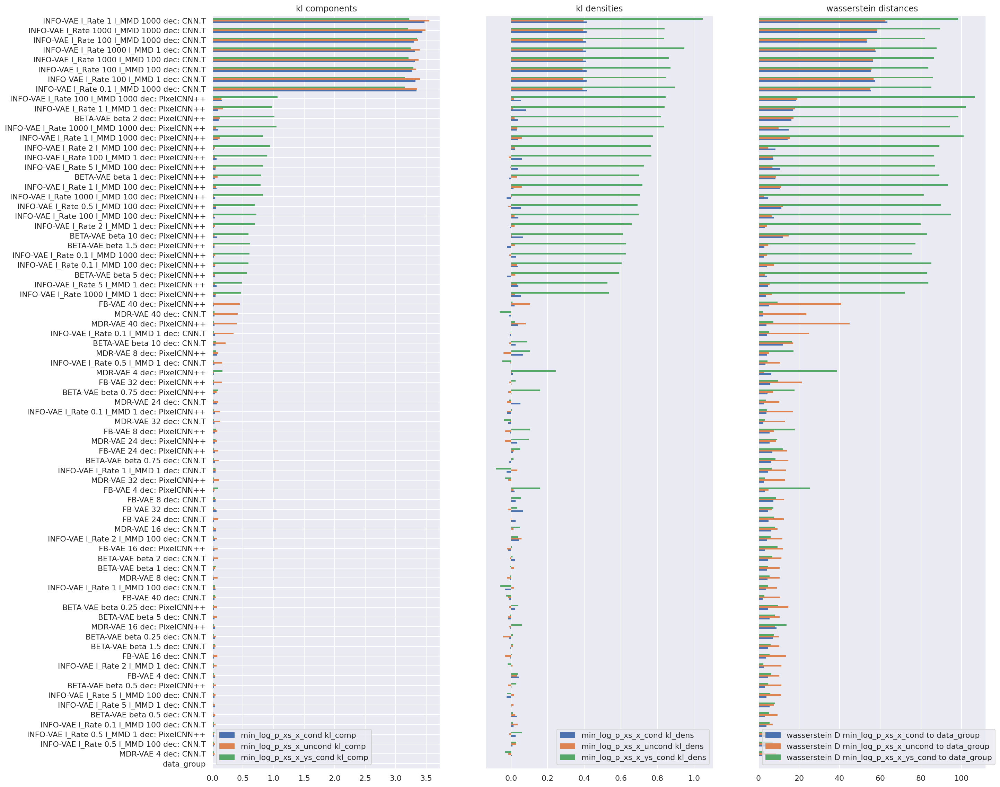

In [23]:
all_df = kl_df.join(wasserstein_df)

was_cols = [c for c in all_df.columns if "wasserstein D" in c]

fig, axs = plt.subplots(ncols=3, figsize=(20, 20))

kl_df = all_df.sort_values("kl_comp sum")
kl_df_select = all_df[comp_cols]
kl_df_select.plot.barh(rot=0, lw=0, ax=axs[0])
axs[0].set_title("kl components")

# kl_df = kl_df.sort_values("kl_dens sum")
kl_df_select = all_df[dens_cols]
kl_df_select.plot.barh(rot=0, lw=0, ax=axs[1])
axs[1].set_title("kl densities")
axs[1].set_yticks([])

was_df_select = all_df[was_cols]
was_df_select.plot.barh(rot=0, lw=0, ax=axs[2])
axs[2].set_title("wasserstein distances")
axs[2].set_yticks([])


[]

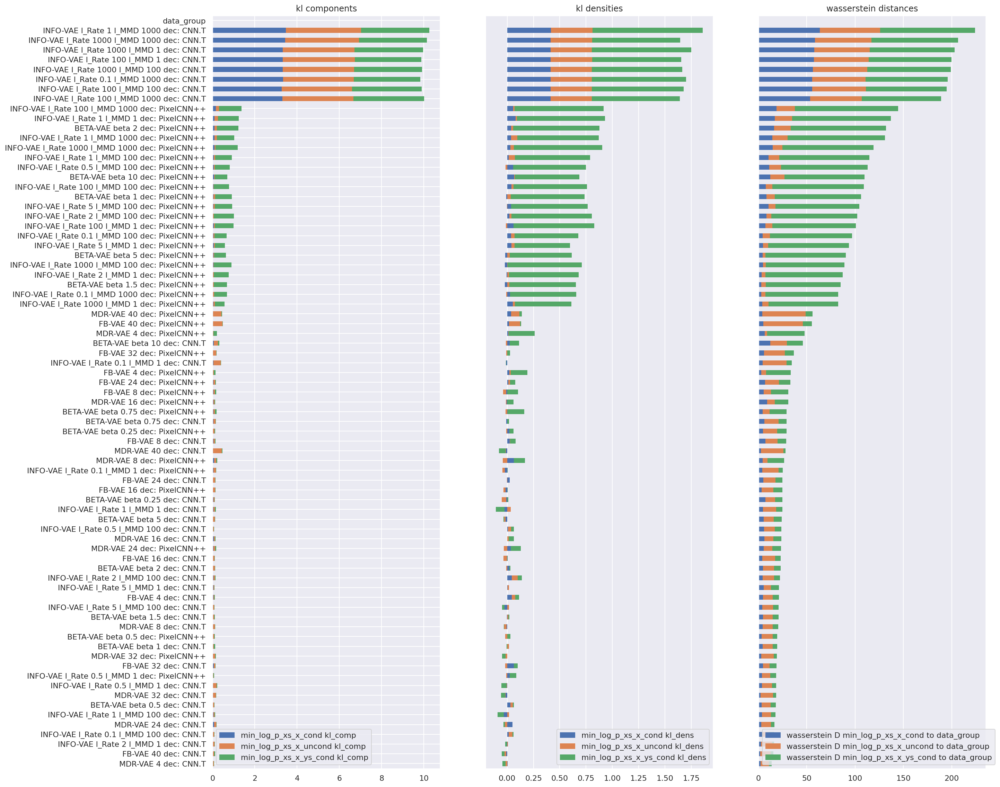

In [25]:
fig, axs = plt.subplots(ncols=3, figsize=(20, 20))

all_df = all_df.sort_values("wasserstein_sum")
kl_df_select = all_df[comp_cols]
kl_df_select.plot.barh(rot=0, lw=0, ax=axs[0], stacked=True)
axs[0].set_title("kl components")

# kl_df = kl_df.sort_values("kl_dens sum")
kl_df_select = all_df[dens_cols]
kl_df_select.plot.barh(rot=0, lw=0, ax=axs[1], stacked=True)
axs[1].set_title("kl densities")
axs[1].set_yticks([])

was_df_select = all_df[was_cols]
was_df_select.plot.barh(rot=0, lw=0, ax=axs[2], stacked=True)
axs[2].set_title("wasserstein distances")
axs[2].set_yticks([])

In [85]:
all_df.columns

Index(['min_log_p_xs_x_cond kl_comp', 'min_log_p_xs_x_uncond kl_comp',
       'min_log_p_xs_x_ys_cond kl_comp', 'min_log_p_xs_x_cond kl_dens',
       'min_log_p_xs_x_uncond kl_dens', 'min_log_p_xs_x_ys_cond kl_dens',
       'kl_comp sum', 'kl_dens sum',
       'wasserstein D min_log_p_xs_x_cond to data_group',
       'wasserstein D min_log_p_xs_x_uncond to data_group',
       'wasserstein D min_log_p_xs_x_ys_cond to data_group',
       'wasserstein_sum'],
      dtype='object')

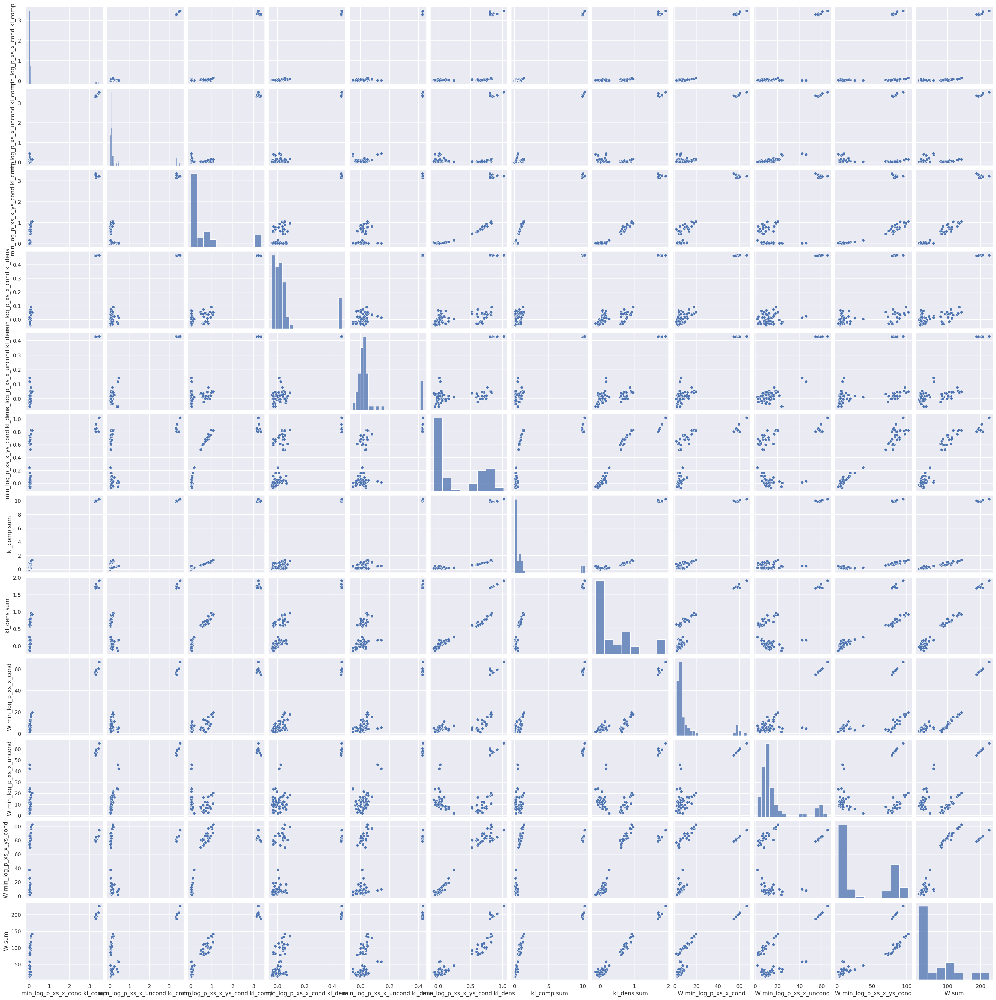

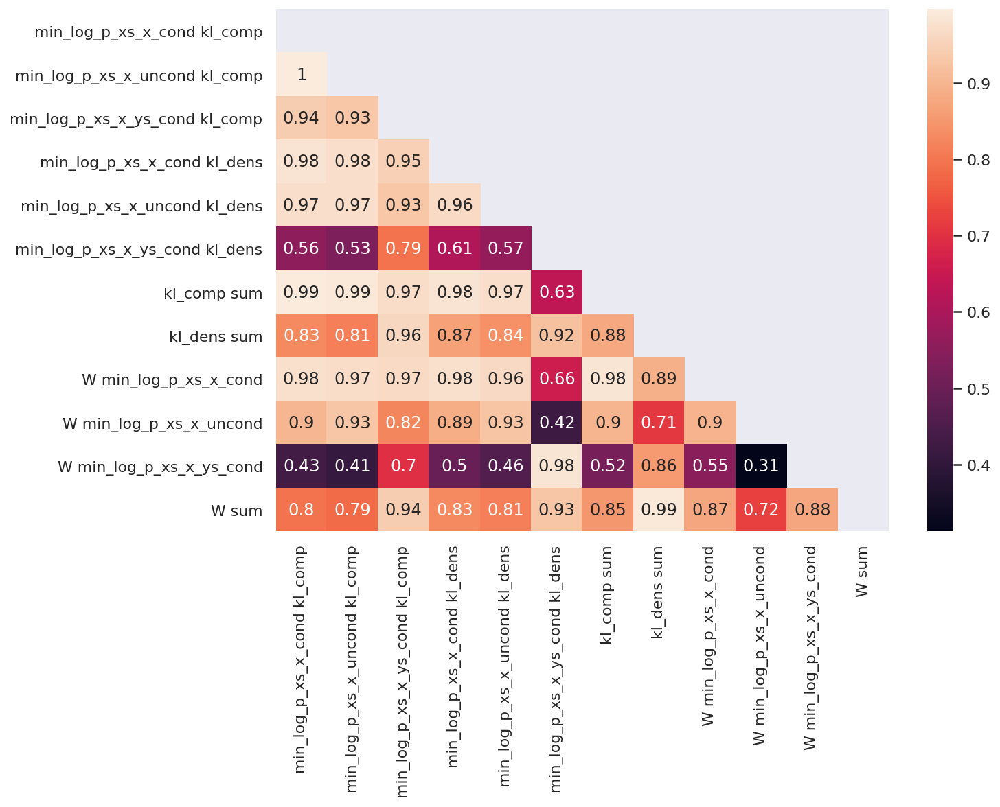

In [89]:
from scipy.stats import pearsonr
import matplotlib.pyplot as plt 

rename_col = {
    'wasserstein D min_log_p_xs_x_cond to data_group':'W min_log_p_xs_x_cond',
    'wasserstein D min_log_p_xs_x_uncond to data_group':'W min_log_p_xs_x_uncond',
    'wasserstein D min_log_p_xs_x_ys_cond to data_group':'W min_log_p_xs_x_ys_cond',
    'wasserstein D min_log_p_y_p_xs_x_cond to data_group': 'W min_log_p_y_p_xs_x_cond',
    'wasserstein_sum': "W sum"
}

renamed_df = all_df.rename(rename_col, axis=1) #.reset_index("group_name", drop=True)

g = sns.pairplot(renamed_df)
plt.show()

fig, ax = plt.subplots(figsize=(10, 7))
corr = renamed_df.corr()
matrix = np.triu(corr)
sns.heatmap(corr, mask=matrix, ax=ax, annot=True);
plt.show()

# Old code

In [16]:
# # [Ns, Nx] Sampled component distributions
# loc_z = dp_mixture.posterior_samples["loc_z"]
# scale_z = dp_mixture.posterior_samples["scale_z"]

# # [Ns, Nx_data] Select those of the data group
# data_group_idx = dp_mixture.group_names.index("data_group")
# loc_z_data_group = loc_z[:, dp_mixture.obs_g == data_group_idx]
# scale_z_data_group = scale_z[:, dp_mixture.obs_g == data_group_idx]

# # [Ns, Nx_data] Instantiate the right distributuon
# truncated_dist_data_group = dist.TruncatedNormal(low=0.0, loc=loc_z_data_group, scale=scale_z_data_group)

# # [Ns, Nx_data] Draw a sample from these distributions
# sample = truncated_dist_data_group.sample(random.PRNGKey(0))

# # [Ns, Nx_data] Evaluate the log_prob
# kl_numerator = truncated_dist_data_group.log_prob(sample)

# # plt.hist(kl_numerator.flatten())
# # plt.show()

# kl_density_est = dict()

# # Compare every group against the data group
# for group in dp_mixture.group_names:
#     if group != "data_group":
        
#         # [Ns, Nx_data] Select sampled distributions of a model group
#         model_group_idx = dp_mixture.group_names.index(group)
#         loc_z_model_group = loc_z[:, dp_mixture.obs_g == model_group_idx]
#         scale_z_model_group = scale_z[:, dp_mixture.obs_g == model_group_idx]
        
#         # Instantiate the right distribution
#         truncated_dist_model_group = dist.TruncatedNormal(low=0.0, 
#                                                           loc=loc_z_model_group, 
#                                                           scale=scale_z_model_group)
#         Ns, Nx_data = sample.shape
        
#         # Q: here I am unsure if all samples need to be evaluated under all distributions?
#         # the shapes happen to be the same so I can evaluate all samples under a different distribution,
#         # but that needed not be the case.
        
#         # Assess log probability of data group samples under model group distributions
#         kl_denominator = truncated_dist_model_group.log_prob(sample)
        
#         # How do I average? Just average over sample (Ns) and observation (Nx_data) dimensions?
#         kl_est = (kl_numerator - kl_denominator).mean()
        
#         # plt.hist(kl_denominator.flatten())
#         # plt.show()
        
#         kl_density_est[group] = kl_est

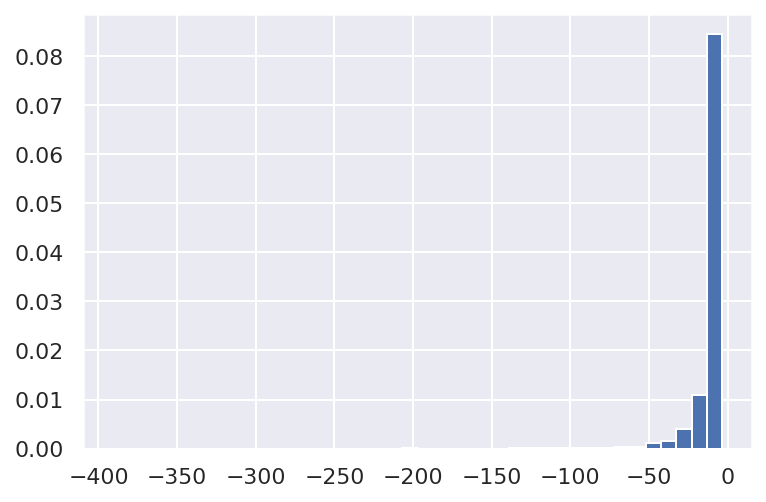

avg_log_prob


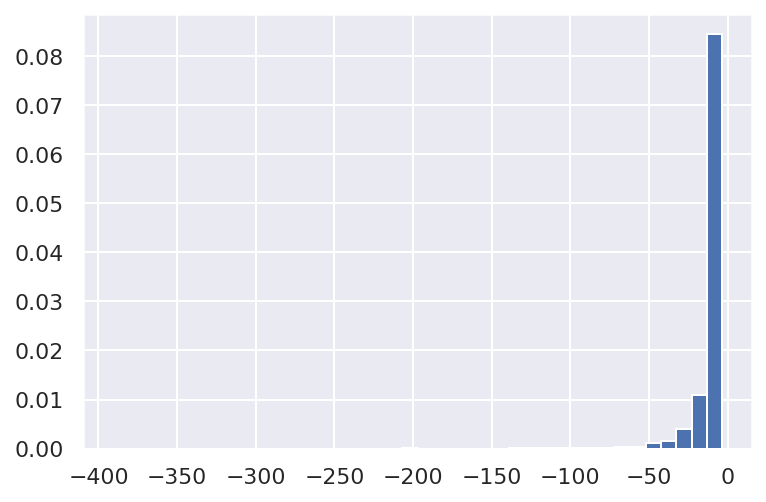

In [16]:
# OLD CODE
# [Ns, Nx] -> sampled component distributions
loc_z = dp_mixture.posterior_samples["loc_z"]
scale_z = dp_mixture.posterior_samples["scale_z"]
truncated_dist = dist.TruncatedNormal(low=0.0, loc=loc_z, scale=scale_z)

# [1, Nx]
y = dp_mixture.obs_y[None, :]

# [Ns, Nx]
log_prob = truncated_dist.log_prob(y)

plt.hist(np.array(log_prob).flatten(), density=True, bins=40)
plt.show()

Ns, Nx = log_prob.shape

avg_log_prob = logsumexp(log_prob, axis=0) - np.log(Ns)
print("avg_log_prob")

plt.hist(np.array(log_prob).flatten(), density=True, bins=40)
plt.show()

df = pd.DataFrame({"avg_log_prob":avg_log_prob, "group_names":np.array(dp_mixture.group_names)[dp_mixture.obs_g].tolist()})

kl_density_est = dict()

for group in df.group_names.unique():
    data_group_log_probs = df[df.group_names == "data_group"]["avg_log_prob"].mean()
    # KL (data | model) ~= log p(data) - log p(model)
    if group != "data_group":
        model_group_log_probs = df[df.group_names == group]["avg_log_prob"].mean()
        #print(data_group_log_probs.shape, model_group_log_probs.shape)
        kl_est = (data_group_log_probs - model_group_log_probs) #.mean()
        kl_density_est[group] = kl_est

# Gather basic stats [old code]

In [45]:
basic_stats = dict()

for i, (clean_name, r) in enumerate(res_dict.items()):
    if clean_name == "data_group": continue
    run_name = r["run_name"]
    
    surprisal_reconstruct_path = f"/home/cbarkhof/fall-2021/analysis/analysis-files/{run_name}/surprisal_reconstruct.pt"
    surprisal_reconstruct = torch.load(surprisal_reconstruct_path)
    surprisal_reconstruct_mean = {f"surpr_recons_{k}": v.mean().item() for k, v in surprisal_reconstruct.items()}
    
    surprisal_data_path = f"/home/cbarkhof/fall-2021/analysis/analysis-files/{run_name}/surprisal_data.pt"
    surprisal_data = torch.load(surprisal_data_path)
    surprisal_data_mean = {f"surpr_data_{k}": v.mean().item() for k, v in surprisal_data.items()}
    
    surprisal_sample_path = f"/home/cbarkhof/fall-2021/analysis/analysis-files/{run_name}/surprisal_sample.pt"
    surprisal_sample = torch.load(surprisal_sample_path)
    surprisal_sample_mean = surprisal_sample.mean().item()
    
    test_valid_path = f"/home/cbarkhof/fall-2021/analysis/analysis-files/{run_name}/test-valid-results.pt"
    test_valid_res = torch.load(test_valid_path)
    
    s = ['elbo mean', 'distortion mean', 'kl_prior_post mean']
    test_valid_sum = {f"{phase} {key}":test_valid_res[phase][key] for key in s for phase in ["test", "valid"]}
    
    mmd_redo_path = f"/home/cbarkhof/fall-2021/analysis/analysis-files/{run_name}/redo_mmd.pt"
    mmd_redo = torch.load(mmd_redo_path)
    
    stats = {"run_name":run_name, 
             "surpr_sample":surprisal_sample_mean, 
             **test_valid_sum,
             **surprisal_data_mean,  
             **surprisal_reconstruct_mean, 
             **mmd_redo}
    
    basic_stats[clean_name] = stats
    
basic_stats_df = pd.DataFrame(basic_stats).transpose()
basic_stats_df.to_csv("basic_stats_runs.csv")